1. Import Dependencies

In [1]:
! pip install tensorflow keras_cv --upgrade --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 613.1/613.1 kB 55.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 99.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 81.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 100.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 71.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 72.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 36.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.15.1 requires tensorflow<2.16,>=2.15, but you have tensorflow 2.16.1 which is incompatible.


In [2]:
import time
import keras_cv
from tensorflow import keras
import matplotlib.pyplot as plt

2. Stable diffusion model

In [3]:
model = keras_cv.models.StableDiffusion(img_width=512, img_height=512)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


In [4]:
def plot_images(images):
    plt.figure(figsize=(20, 20))
    for i in range(len(images)):
        ax = plt.subplot(1, len(images), i + 1)
        plt.imshow(images[i])
        plt.axis("off")


50/50 ━━━━━━━━━━━━━━━━━━━━ 93s 2s/step


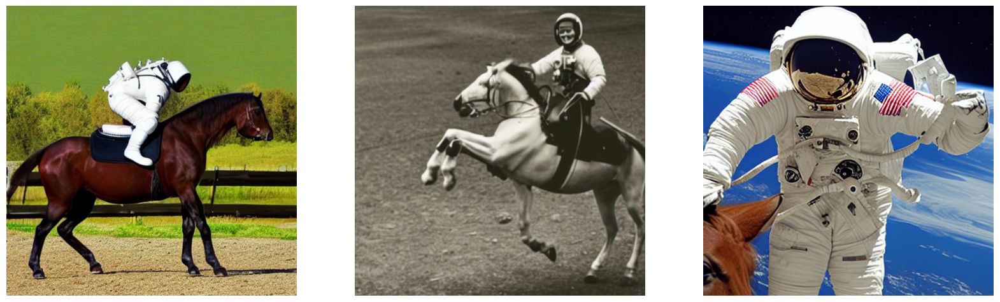

In [ ]:
images = model.text_to_image("photograph of an astronaut riding a horse", batch_size=3)
plot_images(images)

50/50 ━━━━━━━━━━━━━━━━━━━━ 90s 2s/step


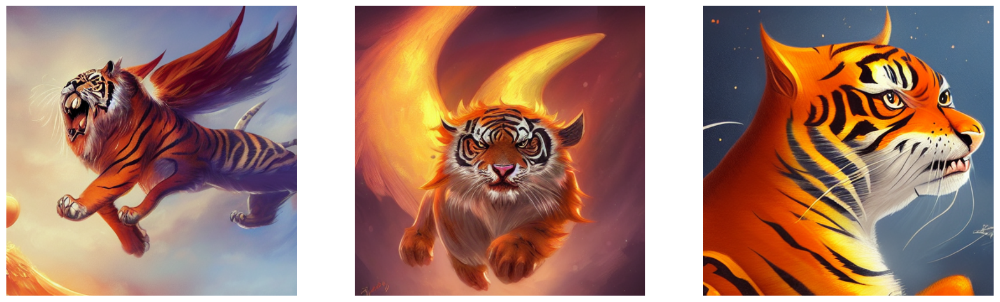

In [ ]:
images = model.text_to_image(
    "cute magical flying tiger, fantasy art, "
    "golden orange color, high quality, highly detailed, elegant, sharp focus, "
    "concept art, character concepts, digital painting, mystery, adventure",
    batch_size=3,
)
plot_images(images)

#How does this  work?

You may be familiar with the idea of super-resolution: it's possible to train a deep learning model to denoise an input image -- and thereby turn it into a higher-resolution version. The deep learning model doesn't do this by magically recovering the information that's missing from the noisy, low-resolution input -- rather, the model uses its training data distribution to hallucinate the visual details that would be most likely given the input. To learn more about super-resolution

First, your text prompt gets projected into a latent vector space by the text encoder, which is simply a pretrained, frozen language model. Then that prompt vector is concatenated to a randomly generated noise patch, which is repeatedly "denoised" by the diffusion model over a series of "steps" (the more steps you run the clearer and nicer your image will be -- the default value is 50 steps).

Finally, the 64x64 latent image is sent through the decoder to properly render it in high resolution.

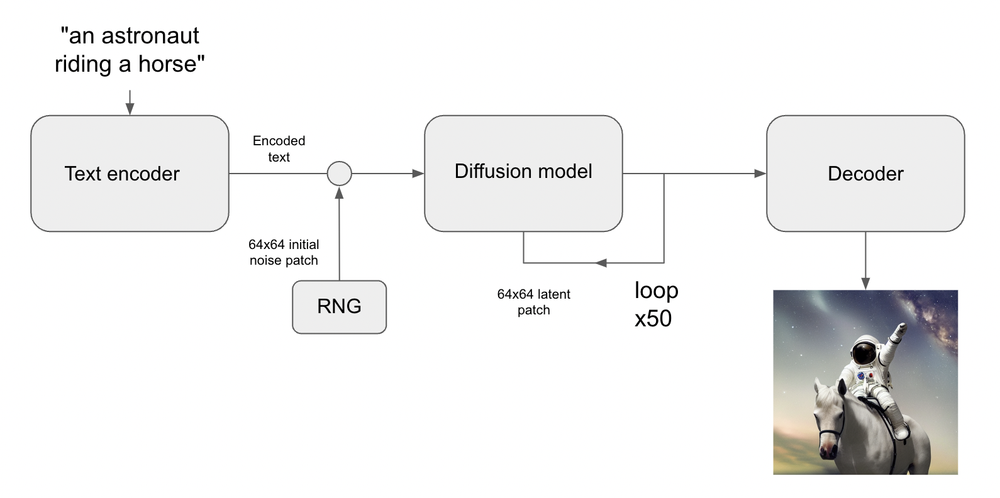

# First benchmark  unoptimized model:

50/50 ━━━━━━━━━━━━━━━━━━━━ 94s 2s/step
Standard model: 96.04 seconds


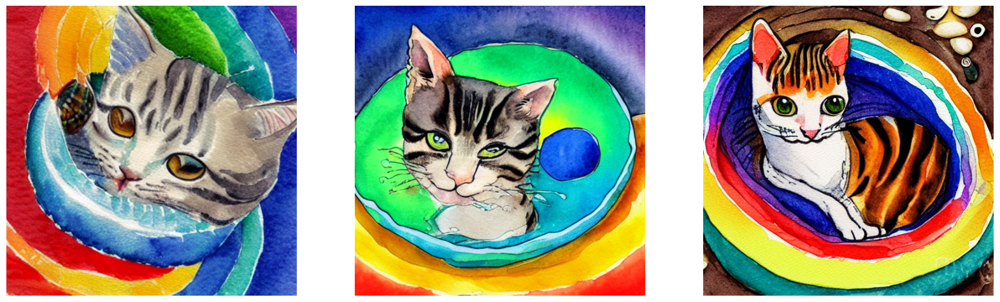

In [10]:
benchmark_result = []
start = time.time()
images = model.text_to_image(
    "A cute kitty in a rainbow whirlpool holding shells, watercolor",
    batch_size=3,
)
end = time.time()
benchmark_result.append(["Standard", end - start])
plot_images(images)

print(f"Standard model: {(end - start):.2f} seconds")
keras.backend.clear_session()  # Clear session to preserve memory.

# Mixed precision

"Mixed precision" consists of performing computation using float16 precision, while storing weights in the float32 format. This is done to take advantage of the fact that float16 operations are backed by significantly faster kernels than their float32 counterparts on modern NVIDIA GPUs.

Enabling mixed precision computation in Keras (and therefore for keras_cv.models.StableDiffusion) is as simple as calling:

In [5]:
keras.mixed_precision.set_global_policy("mixed_float16")

In [6]:
model = keras_cv.models.StableDiffusion()

print("Compute dtype:", model.diffusion_model.compute_dtype)
print(
    "Variable dtype:",
    model.diffusion_model.variable_dtype,
)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE
3439090152/3439090152 ━━━━━━━━━━━━━━━━━━━━ 27s 0us/step
Compute dtype: float16
Variable dtype: float32


# Warm up model to run graph tracing before benchmarking.

50/50 ━━━━━━━━━━━━━━━━━━━━ 84s 612ms/step
50/50 ━━━━━━━━━━━━━━━━━━━━ 30s 598ms/step
Mixed precision model: 30.52 seconds


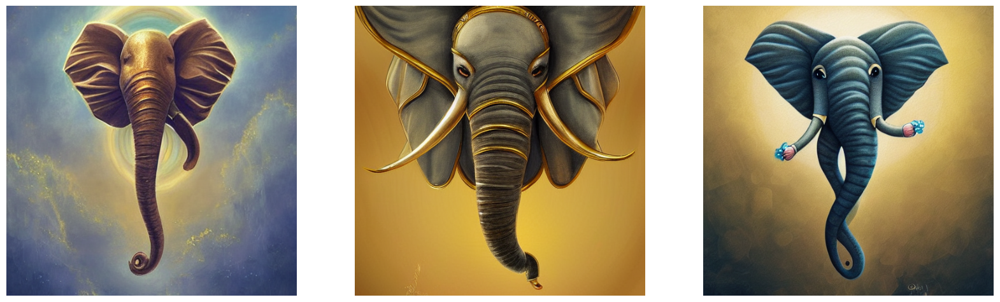

In [9]:
model.text_to_image("warming up the model", batch_size=3)

start = time.time()
images = model.text_to_image(
    "a cute magical flying elephant, fantasy art, "
    "golden color, high quality, highly detailed, elegant, sharp focus, "
    "digital painting",
    batch_size=3,
)
end = time.time()
benchmark_result.append(["Mixed Precision", end - start])
plot_images(images)

print(f"Mixed precision model: {(end - start):.2f} seconds")
keras.backend.clear_session()

#XLA Compilation

TensorFlow comes with the XLA: Accelerated Linear Algebra compiler built-in. keras_cv.models.StableDiffusion supports a jit_compile argument out of the box. Setting this argument to True enables XLA compilation, resulting in a significant speed-up.

In [7]:
# Set back to the default for benchmarking purposes.
keras.mixed_precision.set_global_policy("float32")

# Before we benchmark the model, we run inference once to make sure the TensorFlow graph has already been traced.

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE
1356917/1356917 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
492466864/492466864 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
50/50 ━━━━━━━━━━━━━━━━━━━━ 263s 2s/step
198180272/198180272 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


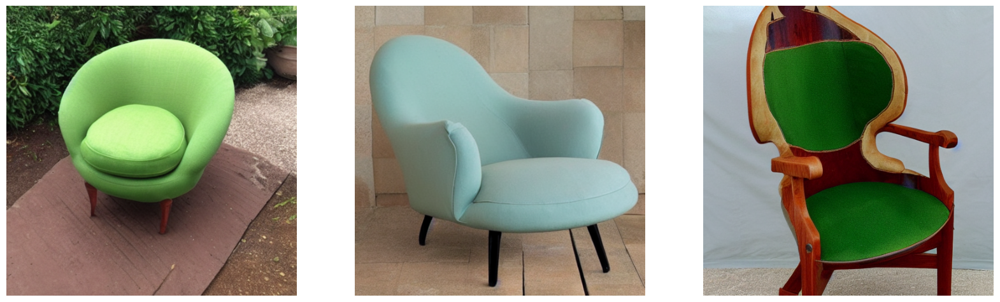

In [8]:
model = keras_cv.models.StableDiffusion(jit_compile=True)
images = model.text_to_image("An avocado armchair", batch_size=3)
plot_images(images)

# Let's benchmark our XLA model:

50/50 ━━━━━━━━━━━━━━━━━━━━ 96s 2s/step
With XLA: 98.94 seconds


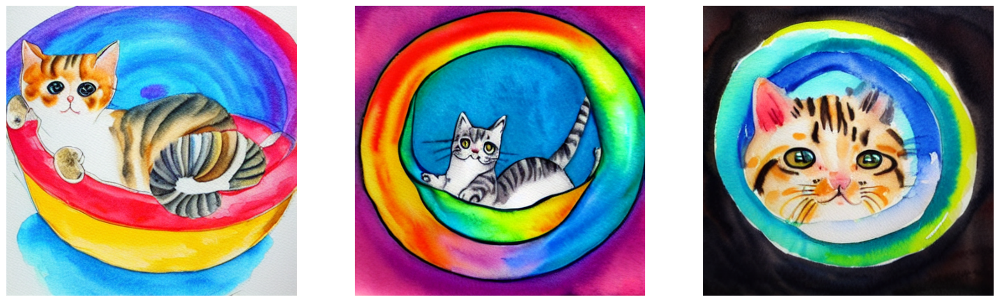

In [11]:
start = time.time()
images = model.text_to_image(
    "A cute kitty in a rainbow whirlpool holding shells, watercolor",
    batch_size=3,
)
end = time.time()
benchmark_result.append(["XLA", end - start])
plot_images(images)

print(f"With XLA: {(end - start):.2f} seconds")
keras.backend.clear_session()

#Putting it all together

In [12]:
keras.mixed_precision.set_global_policy("mixed_float16")
model = keras_cv.models.StableDiffusion(jit_compile=True)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


50/50 ━━━━━━━━━━━━━━━━━━━━ 32s 631ms/step


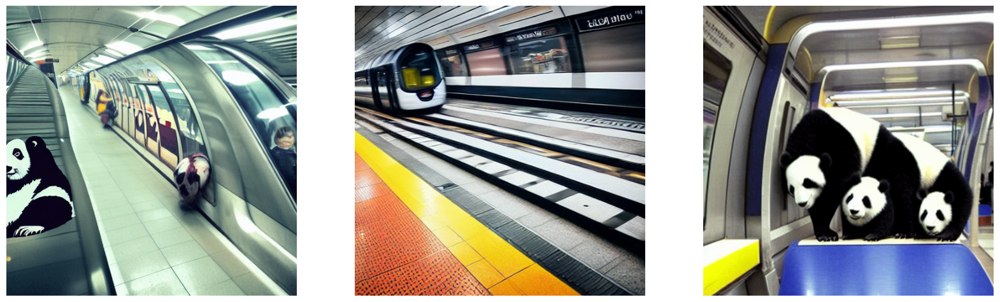

In [17]:
# Let's make sure to warm up the model
images = model.text_to_image(
    "pandas traveling in metro",
    batch_size=3,
)
plot_images(images)

50/50 ━━━━━━━━━━━━━━━━━━━━ 32s 633ms/step
XLA + mixed precision: 32.36 seconds


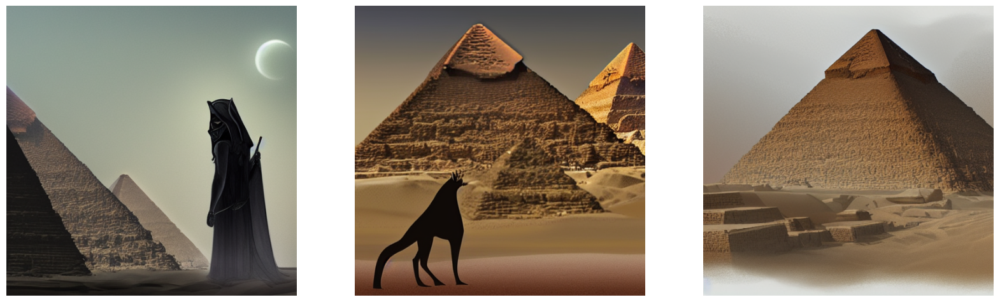

In [19]:
start = time.time()
images = model.text_to_image(
    "A mysterious dark stranger visits the great pyramids of egypt, "
    "high quality, highly detailed, elegant, sharp focus, "
    "concept art, character concepts, digital painting",
    batch_size=3,
)
end = time.time()
benchmark_result.append(["XLA + Mixed Precision", end - start])
plot_images(images)

print(f"XLA + mixed precision: {(end - start):.2f} seconds")

In [20]:
print("{:<22} {:<22}".format("Model", "Runtime"))
for result in benchmark_result:
    name, runtime = result
    print("{:<22} {:<22}".format(name, runtime))

Model                  Runtime               
Standard               96.04067635536194     
XLA                    98.93640470504761     
XLA + Mixed Precision  193.312495470047      
XLA + Mixed Precision  32.357749700546265    
